# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: data: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

SVHN Training Set: 182MB [02:58, 1.02MB/s]                              
SVHN Testing Set: 64.3MB [00:39, 1.63MB/s]                              


These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

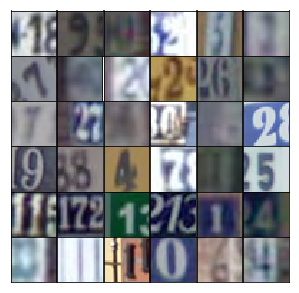

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=False, sharey=False, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
a = np.reshape(np.arange(12), [3,4])

In [8]:
a

array([[ 0,  1,  2,  3],
       [ 4,  5,  6,  7],
       [ 8,  9, 10, 11]])

### 转置坐标系

In [9]:
np.rollaxis(a, 1)

array([[ 0,  4,  8],
       [ 1,  5,  9],
       [ 2,  6, 10],
       [ 3,  7, 11]])

In [10]:
np.moveaxis(a, 1, 0)

array([[ 0,  4,  8],
       [ 1,  5,  9],
       [ 2,  6, 10],
       [ 3,  7, 11]])

In [11]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [12]:
def model_inputs(real_dim, z_dim):
    with tf.name_scope('input'):
        # real_dim = 32*32*3
        inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
        inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [13]:
def leaky_relus(x, alpha=0.2):
    return tf.maximum(x*alpha, x)

In [14]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        project = tf.layers.dense(z, 4*4*512, use_bias=False,activation=None, name='project')
        reshape = tf.reshape(project,[-1, 4, 4, 512], name='reshape')
        x = tf.layers.batch_normalization(reshape, training=training)
        conv1 = tf.identity(leaky_relus(x, alpha), name='conv1')
        #now 4*4*512
        
        conv2 = tf.layers.conv2d_transpose(conv1, 256, 5, strides=(2,2), padding='same')
        conv2 = tf.layers.batch_normalization(conv2, training=training)
        conv2 = tf.identity(leaky_relus(conv2, alpha), name='conv2')
        #now 8*8*256
        
        conv3 = tf.layers.conv2d_transpose(conv2, 128, 5, strides=(2,2), padding='same')
        conv3 = tf.layers.batch_normalization(conv3, training=training)
        conv3 = tf.identity(leaky_relus(conv3,alpha), name='conv3')
        #now 16*16*128
        
        # Output layer, 32x32x3
        logits = tf.layers.conv2d_transpose(conv3, output_dim, 5, strides=(2,2), padding='same', name='logits')
        
        out = tf.tanh(logits, name='out')
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've built before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [15]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
#         x = tf.layers.batch_normalization(x, training=True)
        x = tf.identity(leaky_relus(x, alpha), name='conv1')
        #now 16*16*64
        
        conv2 = tf.layers.conv2d(x, 128, 5, strides=2, padding='same')
        conv2 = tf.layers.batch_normalization(conv2, training=True)
        conv2 = tf.identity(leaky_relus(conv2, alpha), name='conv2')
        #now 8*8*128
        
        conv3 = tf.layers.conv2d(conv2, 256, 5, strides=2, padding='same')
        conv3 = tf.layers.batch_normalization(conv3, training=True)
        conv3 = tf.identity(leaky_relus(conv3, alpha), name='conv3')
        #now 4*4*256
        
        flat = tf.reshape(conv3, [-1, 2*2*128])
        logits = tf.layers.dense(flat, 1, name='logits')
        out = tf.nn.sigmoid(logits, name='out')
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [16]:
def model_loss(input_real, input_z, output_dim, alpha=0.2, smooth=0.1):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    with tf.name_scope('loss'):
        g_model = generator(input_z, output_dim, alpha=alpha)
        d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
        d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

        d_loss_real = tf.reduce_mean(
            tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)*(1-smooth)))
        d_loss_fake = tf.reduce_mean(
            tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
        g_loss = tf.reduce_mean(
            tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

        d_loss = d_loss_real + d_loss_fake
        
        tf.summary.scalar('d_loss_real', d_loss_real)
        tf.summary.scalar('d_loss_fake', d_loss_fake)
        tf.summary.scalar('d_loss', d_loss)
        tf.summary.scalar('g_loss',g_loss)

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [17]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    with tf.name_scope('optimization'):
        # Optimize
        with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
            d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
            g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [18]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)
        
        self.summary = tf.summary.merge_all()

Here is a function for displaying generated images.

In [19]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [20]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5),writer_dis=None,writer_gen=None):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _,d_summary = sess.run([net.d_opt, net.summary], feed_dict={net.input_real: x, net.input_z: batch_z})
                _,g_summary = sess.run([net.g_opt, net.summary], feed_dict={net.input_z: batch_z, net.input_real: x})
                if writer_dis != None:
                    writer_dis.add_summary(d_summary, steps)
                if writer_gen != None:
                    writer_gen.add_summary(g_summary, steps)
                
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [21]:
tensorboard = '/tmp/dcgan/'

In [22]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 64
epochs = 3
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)
writer_discriminator = tf.summary.FileWriter(tensorboard+'discriminator',graph=tf.get_default_graph())
writer_generator = tf.summary.FileWriter(tensorboard+'generator')

Epoch 1/3... Discriminator Loss: 1.3481... Generator Loss: 0.7206
Epoch 1/3... Discriminator Loss: 1.0028... Generator Loss: 1.2535
Epoch 1/3... Discriminator Loss: 0.8478... Generator Loss: 1.6339
Epoch 1/3... Discriminator Loss: 0.6689... Generator Loss: 1.6423
Epoch 1/3... Discriminator Loss: 0.6632... Generator Loss: 1.7835
Epoch 1/3... Discriminator Loss: 0.7217... Generator Loss: 1.7718
Epoch 1/3... Discriminator Loss: 0.6280... Generator Loss: 1.8133
Epoch 1/3... Discriminator Loss: 1.1319... Generator Loss: 1.3154
Epoch 1/3... Discriminator Loss: 1.0568... Generator Loss: 0.9550
Epoch 1/3... Discriminator Loss: 1.0867... Generator Loss: 1.0686


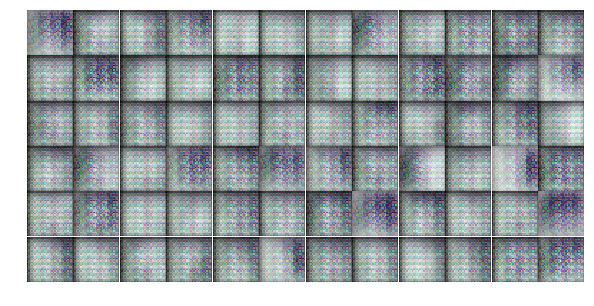

Epoch 1/3... Discriminator Loss: 1.0996... Generator Loss: 1.2866
Epoch 1/3... Discriminator Loss: 0.9445... Generator Loss: 1.2042
Epoch 1/3... Discriminator Loss: 0.9205... Generator Loss: 1.4099
Epoch 1/3... Discriminator Loss: 0.9465... Generator Loss: 1.1030
Epoch 1/3... Discriminator Loss: 0.8285... Generator Loss: 1.3070
Epoch 1/3... Discriminator Loss: 0.8890... Generator Loss: 1.7898
Epoch 1/3... Discriminator Loss: 0.9200... Generator Loss: 1.2519
Epoch 1/3... Discriminator Loss: 1.0998... Generator Loss: 1.2228
Epoch 1/3... Discriminator Loss: 1.0905... Generator Loss: 1.7534
Epoch 1/3... Discriminator Loss: 1.1535... Generator Loss: 0.7946


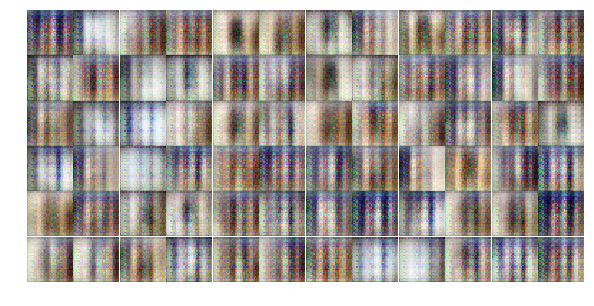

Epoch 1/3... Discriminator Loss: 2.0899... Generator Loss: 0.3209
Epoch 1/3... Discriminator Loss: 1.0484... Generator Loss: 1.3790
Epoch 1/3... Discriminator Loss: 1.2092... Generator Loss: 0.7713
Epoch 1/3... Discriminator Loss: 0.9623... Generator Loss: 1.5423
Epoch 1/3... Discriminator Loss: 0.8879... Generator Loss: 1.5419
Epoch 1/3... Discriminator Loss: 1.0235... Generator Loss: 1.1205
Epoch 1/3... Discriminator Loss: 0.8586... Generator Loss: 1.3520
Epoch 1/3... Discriminator Loss: 1.0518... Generator Loss: 1.0201
Epoch 1/3... Discriminator Loss: 1.1474... Generator Loss: 0.9960
Epoch 1/3... Discriminator Loss: 0.8420... Generator Loss: 1.3687


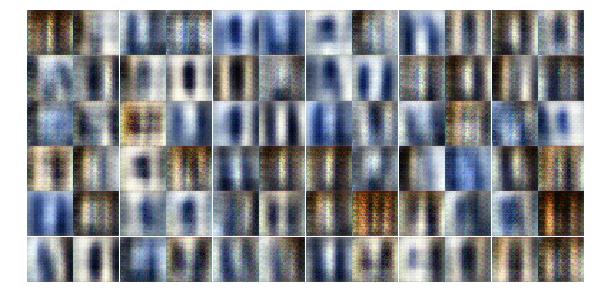

Epoch 1/3... Discriminator Loss: 1.1495... Generator Loss: 0.7882
Epoch 1/3... Discriminator Loss: 0.8970... Generator Loss: 1.3789
Epoch 1/3... Discriminator Loss: 1.0042... Generator Loss: 1.4690
Epoch 1/3... Discriminator Loss: 0.7606... Generator Loss: 1.4860
Epoch 1/3... Discriminator Loss: 0.6210... Generator Loss: 1.9140
Epoch 1/3... Discriminator Loss: 0.8641... Generator Loss: 1.0994
Epoch 1/3... Discriminator Loss: 0.7555... Generator Loss: 1.9316
Epoch 1/3... Discriminator Loss: 1.0716... Generator Loss: 1.1755
Epoch 1/3... Discriminator Loss: 0.6235... Generator Loss: 2.0840
Epoch 1/3... Discriminator Loss: 0.6830... Generator Loss: 1.6254


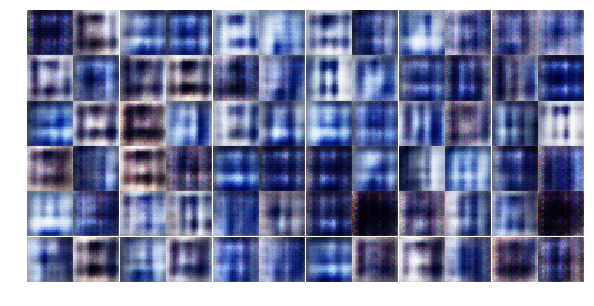

Epoch 1/3... Discriminator Loss: 0.6936... Generator Loss: 1.6080
Epoch 1/3... Discriminator Loss: 0.7941... Generator Loss: 1.1457
Epoch 1/3... Discriminator Loss: 0.5761... Generator Loss: 1.9188
Epoch 1/3... Discriminator Loss: 0.6377... Generator Loss: 2.6370
Epoch 1/3... Discriminator Loss: 0.9060... Generator Loss: 1.1342
Epoch 1/3... Discriminator Loss: 1.3530... Generator Loss: 0.9296
Epoch 1/3... Discriminator Loss: 0.7690... Generator Loss: 1.6294
Epoch 1/3... Discriminator Loss: 1.0734... Generator Loss: 0.8378
Epoch 1/3... Discriminator Loss: 1.0544... Generator Loss: 1.0714
Epoch 1/3... Discriminator Loss: 1.0582... Generator Loss: 1.0433


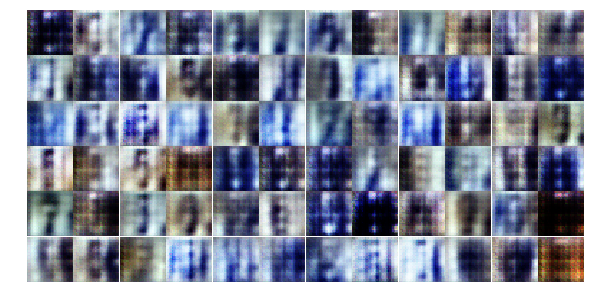

Epoch 1/3... Discriminator Loss: 0.8471... Generator Loss: 1.2288
Epoch 1/3... Discriminator Loss: 0.9103... Generator Loss: 2.0121
Epoch 1/3... Discriminator Loss: 0.6839... Generator Loss: 1.7104
Epoch 1/3... Discriminator Loss: 1.1628... Generator Loss: 0.8059
Epoch 1/3... Discriminator Loss: 0.5959... Generator Loss: 2.4594
Epoch 1/3... Discriminator Loss: 0.9509... Generator Loss: 1.0252
Epoch 1/3... Discriminator Loss: 0.8713... Generator Loss: 1.4878
Epoch 1/3... Discriminator Loss: 0.7852... Generator Loss: 1.7524
Epoch 1/3... Discriminator Loss: 1.3761... Generator Loss: 1.1562
Epoch 1/3... Discriminator Loss: 0.8180... Generator Loss: 1.6098


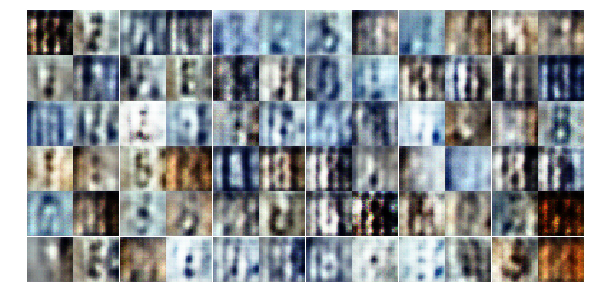

Epoch 1/3... Discriminator Loss: 0.8305... Generator Loss: 1.3569
Epoch 1/3... Discriminator Loss: 0.9363... Generator Loss: 1.0660
Epoch 1/3... Discriminator Loss: 0.6448... Generator Loss: 1.9150
Epoch 1/3... Discriminator Loss: 0.8273... Generator Loss: 1.2587
Epoch 1/3... Discriminator Loss: 0.9056... Generator Loss: 1.3223
Epoch 1/3... Discriminator Loss: 0.7324... Generator Loss: 1.5069
Epoch 1/3... Discriminator Loss: 1.1812... Generator Loss: 0.6561
Epoch 1/3... Discriminator Loss: 1.0805... Generator Loss: 0.7393
Epoch 1/3... Discriminator Loss: 1.1207... Generator Loss: 1.2335
Epoch 1/3... Discriminator Loss: 1.4720... Generator Loss: 0.5618


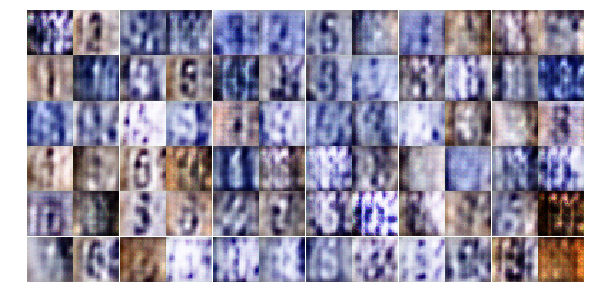

Epoch 1/3... Discriminator Loss: 0.8547... Generator Loss: 1.5674
Epoch 1/3... Discriminator Loss: 0.7770... Generator Loss: 1.4101
Epoch 1/3... Discriminator Loss: 0.6132... Generator Loss: 1.8429
Epoch 1/3... Discriminator Loss: 0.9033... Generator Loss: 1.5779
Epoch 1/3... Discriminator Loss: 0.6600... Generator Loss: 1.6788
Epoch 1/3... Discriminator Loss: 0.8974... Generator Loss: 1.4252
Epoch 1/3... Discriminator Loss: 0.7082... Generator Loss: 1.9390
Epoch 1/3... Discriminator Loss: 0.8905... Generator Loss: 1.1976
Epoch 1/3... Discriminator Loss: 0.9501... Generator Loss: 1.3465
Epoch 1/3... Discriminator Loss: 0.6998... Generator Loss: 1.4914


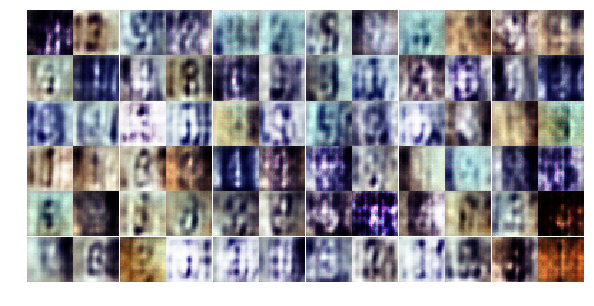

Epoch 1/3... Discriminator Loss: 1.0989... Generator Loss: 1.4861
Epoch 1/3... Discriminator Loss: 0.5865... Generator Loss: 2.2923
Epoch 1/3... Discriminator Loss: 0.7236... Generator Loss: 1.4345
Epoch 1/3... Discriminator Loss: 0.7948... Generator Loss: 2.3018
Epoch 1/3... Discriminator Loss: 0.7275... Generator Loss: 2.1541
Epoch 1/3... Discriminator Loss: 1.0179... Generator Loss: 0.8995
Epoch 1/3... Discriminator Loss: 0.7343... Generator Loss: 1.4900
Epoch 1/3... Discriminator Loss: 0.7713... Generator Loss: 1.3197
Epoch 1/3... Discriminator Loss: 1.1880... Generator Loss: 1.0668
Epoch 1/3... Discriminator Loss: 0.7638... Generator Loss: 1.8336


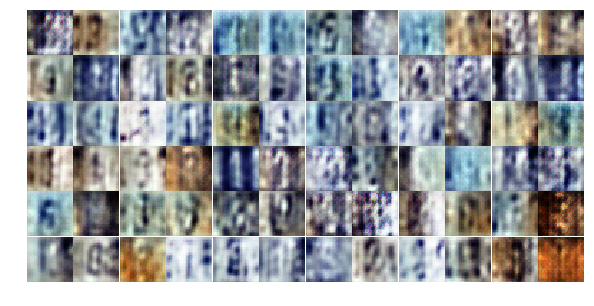

Epoch 1/3... Discriminator Loss: 0.6971... Generator Loss: 1.4888
Epoch 1/3... Discriminator Loss: 0.8612... Generator Loss: 1.1592
Epoch 1/3... Discriminator Loss: 0.7315... Generator Loss: 1.2993
Epoch 1/3... Discriminator Loss: 1.3165... Generator Loss: 0.5331
Epoch 1/3... Discriminator Loss: 0.4940... Generator Loss: 2.3519
Epoch 1/3... Discriminator Loss: 0.8032... Generator Loss: 1.9712
Epoch 1/3... Discriminator Loss: 1.0534... Generator Loss: 0.8411
Epoch 1/3... Discriminator Loss: 0.9802... Generator Loss: 0.9027
Epoch 1/3... Discriminator Loss: 0.5113... Generator Loss: 2.3988
Epoch 1/3... Discriminator Loss: 0.4218... Generator Loss: 2.9036


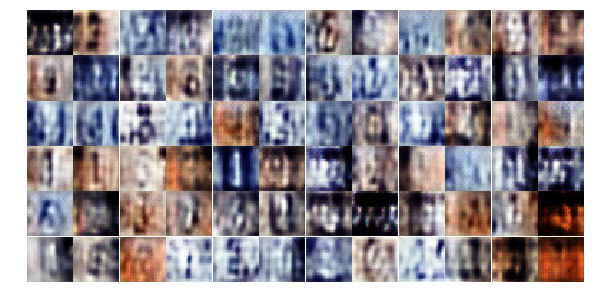

Epoch 1/3... Discriminator Loss: 0.9872... Generator Loss: 0.8580
Epoch 1/3... Discriminator Loss: 0.4510... Generator Loss: 3.6548
Epoch 1/3... Discriminator Loss: 0.6135... Generator Loss: 1.6846
Epoch 1/3... Discriminator Loss: 0.5135... Generator Loss: 2.8464
Epoch 1/3... Discriminator Loss: 0.8929... Generator Loss: 1.6148
Epoch 1/3... Discriminator Loss: 0.7637... Generator Loss: 1.8932
Epoch 1/3... Discriminator Loss: 1.0166... Generator Loss: 2.0238
Epoch 1/3... Discriminator Loss: 0.4307... Generator Loss: 2.7732
Epoch 1/3... Discriminator Loss: 0.7580... Generator Loss: 2.7575
Epoch 1/3... Discriminator Loss: 0.6146... Generator Loss: 1.6789


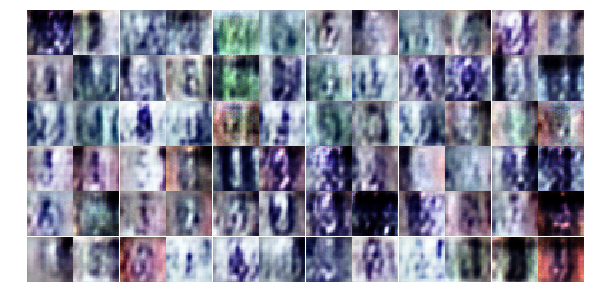

Epoch 1/3... Discriminator Loss: 0.4335... Generator Loss: 2.6714
Epoch 1/3... Discriminator Loss: 0.7393... Generator Loss: 1.2614
Epoch 1/3... Discriminator Loss: 0.5846... Generator Loss: 1.8353
Epoch 1/3... Discriminator Loss: 1.1735... Generator Loss: 0.6587
Epoch 2/3... Discriminator Loss: 0.7844... Generator Loss: 1.2561
Epoch 2/3... Discriminator Loss: 0.4052... Generator Loss: 3.4553
Epoch 2/3... Discriminator Loss: 0.5393... Generator Loss: 3.1278
Epoch 2/3... Discriminator Loss: 0.4990... Generator Loss: 2.6356
Epoch 2/3... Discriminator Loss: 0.3801... Generator Loss: 4.1764
Epoch 2/3... Discriminator Loss: 1.1754... Generator Loss: 0.6321


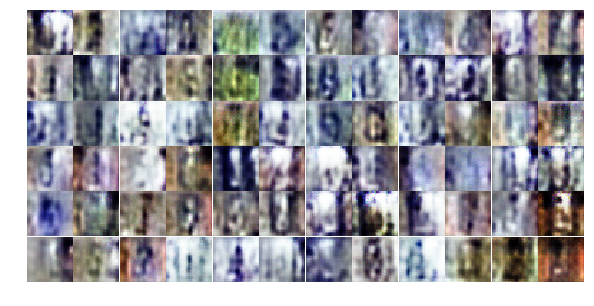

Epoch 2/3... Discriminator Loss: 0.4760... Generator Loss: 3.5678
Epoch 2/3... Discriminator Loss: 0.4662... Generator Loss: 2.3009
Epoch 2/3... Discriminator Loss: 0.6967... Generator Loss: 1.6219
Epoch 2/3... Discriminator Loss: 0.8696... Generator Loss: 0.9555
Epoch 2/3... Discriminator Loss: 0.4253... Generator Loss: 2.6474
Epoch 2/3... Discriminator Loss: 0.7961... Generator Loss: 1.1158
Epoch 2/3... Discriminator Loss: 0.7574... Generator Loss: 1.2062
Epoch 2/3... Discriminator Loss: 0.4998... Generator Loss: 2.3813
Epoch 2/3... Discriminator Loss: 0.4943... Generator Loss: 2.1869
Epoch 2/3... Discriminator Loss: 0.3782... Generator Loss: 5.1788


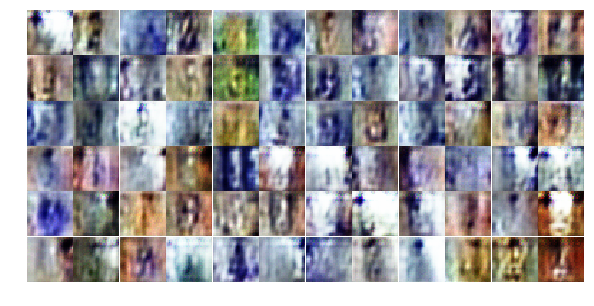

Epoch 2/3... Discriminator Loss: 0.4677... Generator Loss: 2.3607
Epoch 2/3... Discriminator Loss: 0.4252... Generator Loss: 2.7031
Epoch 2/3... Discriminator Loss: 0.4699... Generator Loss: 3.1673
Epoch 2/3... Discriminator Loss: 1.4409... Generator Loss: 0.4923
Epoch 2/3... Discriminator Loss: 0.4875... Generator Loss: 3.2764
Epoch 2/3... Discriminator Loss: 0.4068... Generator Loss: 3.7725
Epoch 2/3... Discriminator Loss: 0.3935... Generator Loss: 3.4525
Epoch 2/3... Discriminator Loss: 1.1057... Generator Loss: 0.7110
Epoch 2/3... Discriminator Loss: 0.7387... Generator Loss: 1.2306
Epoch 2/3... Discriminator Loss: 0.6410... Generator Loss: 1.5021


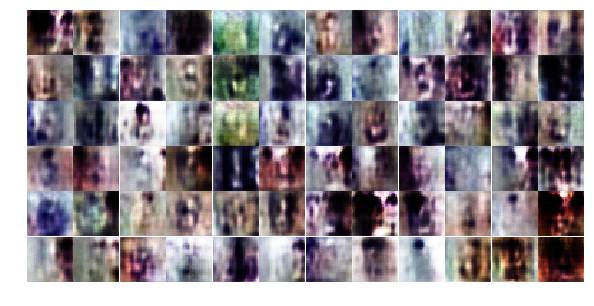

Epoch 2/3... Discriminator Loss: 1.3120... Generator Loss: 2.4068
Epoch 2/3... Discriminator Loss: 0.7028... Generator Loss: 3.8067
Epoch 2/3... Discriminator Loss: 0.5289... Generator Loss: 3.9942
Epoch 2/3... Discriminator Loss: 0.5933... Generator Loss: 1.8061
Epoch 2/3... Discriminator Loss: 0.6193... Generator Loss: 3.9341
Epoch 2/3... Discriminator Loss: 0.4605... Generator Loss: 2.7211
Epoch 2/3... Discriminator Loss: 1.0065... Generator Loss: 0.7862
Epoch 2/3... Discriminator Loss: 0.5833... Generator Loss: 1.7414
Epoch 2/3... Discriminator Loss: 0.3669... Generator Loss: 5.5427
Epoch 2/3... Discriminator Loss: 0.3664... Generator Loss: 4.1107


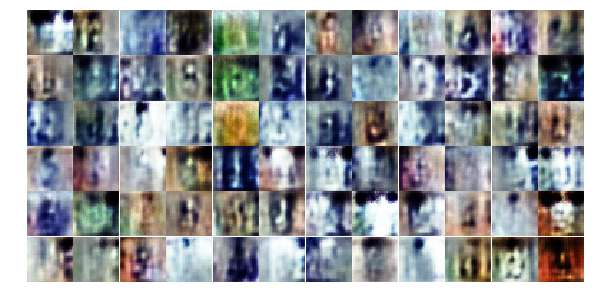

Epoch 2/3... Discriminator Loss: 0.7016... Generator Loss: 1.3059
Epoch 2/3... Discriminator Loss: 0.7059... Generator Loss: 1.2836
Epoch 2/3... Discriminator Loss: 0.4218... Generator Loss: 2.7208
Epoch 2/3... Discriminator Loss: 0.6576... Generator Loss: 1.4686
Epoch 2/3... Discriminator Loss: 0.3866... Generator Loss: 4.1134
Epoch 2/3... Discriminator Loss: 1.0718... Generator Loss: 0.7203
Epoch 2/3... Discriminator Loss: 0.6302... Generator Loss: 1.5102
Epoch 2/3... Discriminator Loss: 0.4223... Generator Loss: 3.4830
Epoch 2/3... Discriminator Loss: 0.4381... Generator Loss: 2.5102
Epoch 2/3... Discriminator Loss: 0.4541... Generator Loss: 2.6249


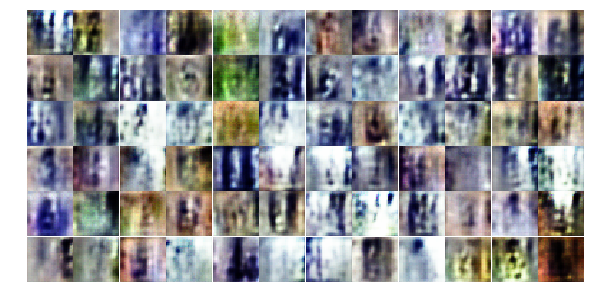

Epoch 2/3... Discriminator Loss: 0.4695... Generator Loss: 2.3562
Epoch 2/3... Discriminator Loss: 0.5254... Generator Loss: 1.8481
Epoch 2/3... Discriminator Loss: 0.3568... Generator Loss: 4.9273
Epoch 2/3... Discriminator Loss: 0.5337... Generator Loss: 1.8624
Epoch 2/3... Discriminator Loss: 3.7759... Generator Loss: 4.8669
Epoch 2/3... Discriminator Loss: 0.9755... Generator Loss: 1.2813
Epoch 2/3... Discriminator Loss: 0.6619... Generator Loss: 2.7642
Epoch 2/3... Discriminator Loss: 0.7452... Generator Loss: 1.2642
Epoch 2/3... Discriminator Loss: 0.3807... Generator Loss: 3.4167
Epoch 2/3... Discriminator Loss: 0.4220... Generator Loss: 3.5413


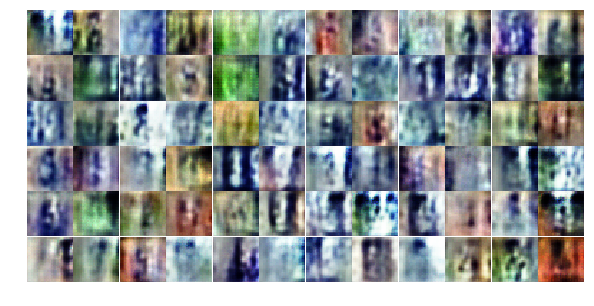

Epoch 2/3... Discriminator Loss: 0.4215... Generator Loss: 4.3909
Epoch 2/3... Discriminator Loss: 0.7445... Generator Loss: 1.2548
Epoch 2/3... Discriminator Loss: 0.7842... Generator Loss: 1.0942
Epoch 2/3... Discriminator Loss: 0.5642... Generator Loss: 1.8823
Epoch 2/3... Discriminator Loss: 0.5531... Generator Loss: 1.7479
Epoch 2/3... Discriminator Loss: 0.4696... Generator Loss: 2.1638
Epoch 2/3... Discriminator Loss: 0.3463... Generator Loss: 4.7596
Epoch 2/3... Discriminator Loss: 0.4905... Generator Loss: 2.0821
Epoch 2/3... Discriminator Loss: 0.3416... Generator Loss: 4.9742
Epoch 2/3... Discriminator Loss: 0.4922... Generator Loss: 2.1184


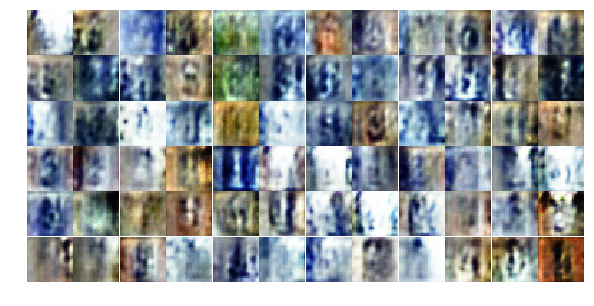

Epoch 2/3... Discriminator Loss: 0.3789... Generator Loss: 4.6060
Epoch 2/3... Discriminator Loss: 0.3747... Generator Loss: 3.3797
Epoch 2/3... Discriminator Loss: 0.3637... Generator Loss: 3.6551
Epoch 2/3... Discriminator Loss: 0.6549... Generator Loss: 1.3930
Epoch 2/3... Discriminator Loss: 0.4671... Generator Loss: 2.2116
Epoch 2/3... Discriminator Loss: 0.4149... Generator Loss: 2.7277
Epoch 2/3... Discriminator Loss: 0.3609... Generator Loss: 3.7947
Epoch 2/3... Discriminator Loss: 0.4348... Generator Loss: 3.5229
Epoch 2/3... Discriminator Loss: 0.4780... Generator Loss: 2.1569
Epoch 2/3... Discriminator Loss: 0.5180... Generator Loss: 1.8798


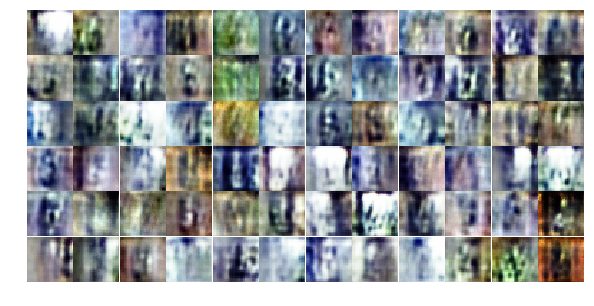

Epoch 2/3... Discriminator Loss: 0.4509... Generator Loss: 2.4447
Epoch 2/3... Discriminator Loss: 0.5078... Generator Loss: 1.9983
Epoch 2/3... Discriminator Loss: 0.4097... Generator Loss: 2.7779
Epoch 2/3... Discriminator Loss: 0.3977... Generator Loss: 2.9695
Epoch 2/3... Discriminator Loss: 0.3780... Generator Loss: 5.1172
Epoch 2/3... Discriminator Loss: 0.5588... Generator Loss: 1.7951
Epoch 2/3... Discriminator Loss: 0.6734... Generator Loss: 1.3605
Epoch 2/3... Discriminator Loss: 0.3951... Generator Loss: 3.0403
Epoch 2/3... Discriminator Loss: 0.6102... Generator Loss: 1.5605
Epoch 2/3... Discriminator Loss: 0.4573... Generator Loss: 2.5245


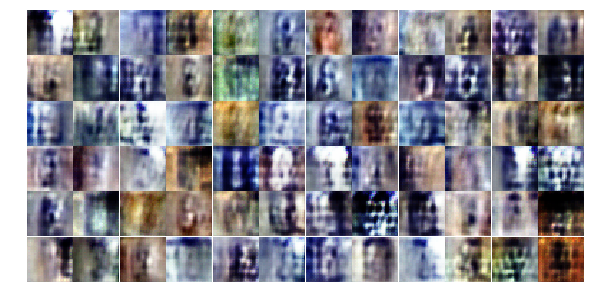

Epoch 2/3... Discriminator Loss: 0.4643... Generator Loss: 2.2282
Epoch 2/3... Discriminator Loss: 0.3598... Generator Loss: 5.0379
Epoch 2/3... Discriminator Loss: 0.8388... Generator Loss: 1.0360
Epoch 2/3... Discriminator Loss: 1.3075... Generator Loss: 0.6837
Epoch 2/3... Discriminator Loss: 0.5760... Generator Loss: 3.9753
Epoch 2/3... Discriminator Loss: 0.4724... Generator Loss: 2.3071
Epoch 2/3... Discriminator Loss: 0.4159... Generator Loss: 3.3140
Epoch 2/3... Discriminator Loss: 0.4206... Generator Loss: 2.6233
Epoch 2/3... Discriminator Loss: 0.5491... Generator Loss: 1.8516
Epoch 2/3... Discriminator Loss: 0.3904... Generator Loss: 3.9687


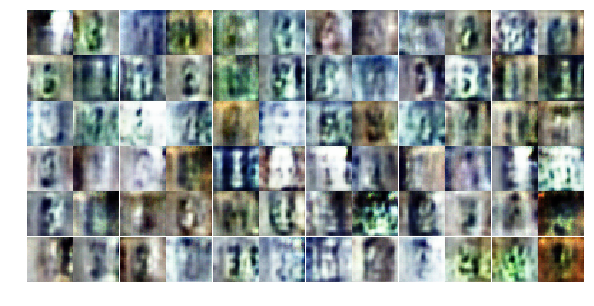

Epoch 2/3... Discriminator Loss: 0.6276... Generator Loss: 1.4769
Epoch 2/3... Discriminator Loss: 0.9283... Generator Loss: 2.5609
Epoch 2/3... Discriminator Loss: 1.3357... Generator Loss: 1.6717
Epoch 2/3... Discriminator Loss: 0.4222... Generator Loss: 3.4822
Epoch 2/3... Discriminator Loss: 0.4637... Generator Loss: 3.6382
Epoch 2/3... Discriminator Loss: 0.3898... Generator Loss: 3.1138
Epoch 2/3... Discriminator Loss: 0.6237... Generator Loss: 1.5782
Epoch 2/3... Discriminator Loss: 0.3969... Generator Loss: 3.0660
Epoch 2/3... Discriminator Loss: 0.4689... Generator Loss: 2.2388
Epoch 2/3... Discriminator Loss: 0.3459... Generator Loss: 5.4121


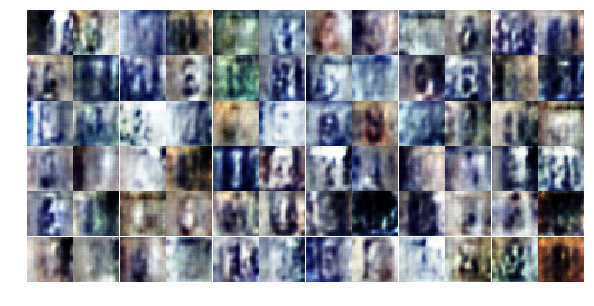

Epoch 2/3... Discriminator Loss: 0.4034... Generator Loss: 4.6941
Epoch 2/3... Discriminator Loss: 0.3545... Generator Loss: 3.9926
Epoch 2/3... Discriminator Loss: 0.6175... Generator Loss: 1.5978
Epoch 2/3... Discriminator Loss: 0.4070... Generator Loss: 5.1533
Epoch 2/3... Discriminator Loss: 0.5963... Generator Loss: 1.5768
Epoch 2/3... Discriminator Loss: 1.2356... Generator Loss: 0.6585
Epoch 2/3... Discriminator Loss: 0.3600... Generator Loss: 5.2057
Epoch 2/3... Discriminator Loss: 0.5599... Generator Loss: 1.7363
Epoch 2/3... Discriminator Loss: 0.3720... Generator Loss: 3.7341
Epoch 3/3... Discriminator Loss: 0.3959... Generator Loss: 4.0246


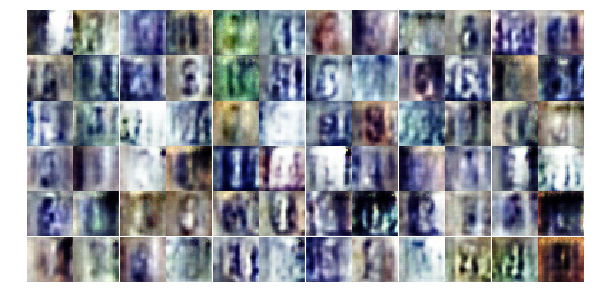

Epoch 3/3... Discriminator Loss: 0.5135... Generator Loss: 1.9787
Epoch 3/3... Discriminator Loss: 0.3750... Generator Loss: 4.3447
Epoch 3/3... Discriminator Loss: 0.3793... Generator Loss: 3.6920
Epoch 3/3... Discriminator Loss: 0.4699... Generator Loss: 2.2871
Epoch 3/3... Discriminator Loss: 0.4049... Generator Loss: 2.8695
Epoch 3/3... Discriminator Loss: 0.3761... Generator Loss: 3.3733
Epoch 3/3... Discriminator Loss: 0.6403... Generator Loss: 4.0001
Epoch 3/3... Discriminator Loss: 0.7317... Generator Loss: 1.2989
Epoch 3/3... Discriminator Loss: 0.5250... Generator Loss: 3.2131
Epoch 3/3... Discriminator Loss: 0.4469... Generator Loss: 3.6468


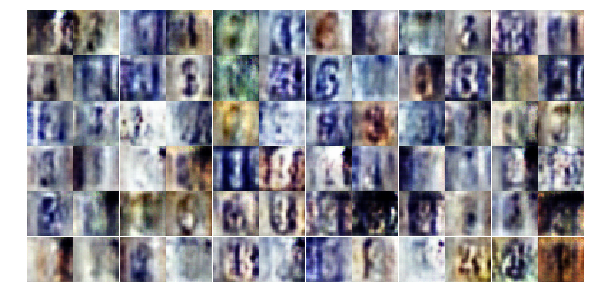

Epoch 3/3... Discriminator Loss: 0.4017... Generator Loss: 3.1933
Epoch 3/3... Discriminator Loss: 0.3768... Generator Loss: 5.3387
Epoch 3/3... Discriminator Loss: 0.6469... Generator Loss: 1.4463
Epoch 3/3... Discriminator Loss: 0.3769... Generator Loss: 4.8719
Epoch 3/3... Discriminator Loss: 0.3655... Generator Loss: 3.7618
Epoch 3/3... Discriminator Loss: 0.6015... Generator Loss: 1.5710
Epoch 3/3... Discriminator Loss: 0.8037... Generator Loss: 1.6634
Epoch 3/3... Discriminator Loss: 0.3673... Generator Loss: 3.9288
Epoch 3/3... Discriminator Loss: 0.6290... Generator Loss: 1.5880
Epoch 3/3... Discriminator Loss: 0.4225... Generator Loss: 2.9438


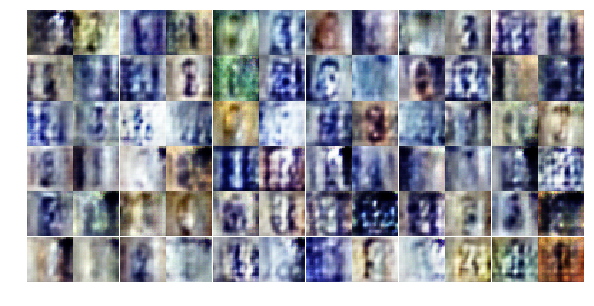

Epoch 3/3... Discriminator Loss: 0.5422... Generator Loss: 1.9639
Epoch 3/3... Discriminator Loss: 0.4423... Generator Loss: 2.7709
Epoch 3/3... Discriminator Loss: 0.7663... Generator Loss: 1.2066
Epoch 3/3... Discriminator Loss: 0.5950... Generator Loss: 1.6222
Epoch 3/3... Discriminator Loss: 0.4819... Generator Loss: 2.3115
Epoch 3/3... Discriminator Loss: 0.3861... Generator Loss: 3.4792
Epoch 3/3... Discriminator Loss: 0.5816... Generator Loss: 1.6725
Epoch 3/3... Discriminator Loss: 0.4378... Generator Loss: 3.9084
Epoch 3/3... Discriminator Loss: 0.4852... Generator Loss: 2.1269
Epoch 3/3... Discriminator Loss: 0.6342... Generator Loss: 1.4557


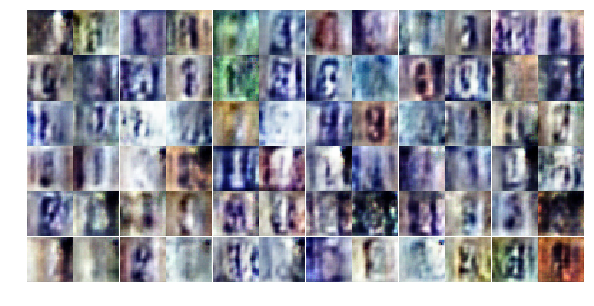

Epoch 3/3... Discriminator Loss: 0.4575... Generator Loss: 3.5215
Epoch 3/3... Discriminator Loss: 0.5253... Generator Loss: 4.3510
Epoch 3/3... Discriminator Loss: 1.3682... Generator Loss: 1.0676
Epoch 3/3... Discriminator Loss: 0.5312... Generator Loss: 2.1231
Epoch 3/3... Discriminator Loss: 0.3742... Generator Loss: 4.0513
Epoch 3/3... Discriminator Loss: 0.3787... Generator Loss: 3.7315
Epoch 3/3... Discriminator Loss: 0.6094... Generator Loss: 1.7658
Epoch 3/3... Discriminator Loss: 0.5543... Generator Loss: 2.5510
Epoch 3/3... Discriminator Loss: 0.4841... Generator Loss: 2.3888
Epoch 3/3... Discriminator Loss: 0.4583... Generator Loss: 2.6321


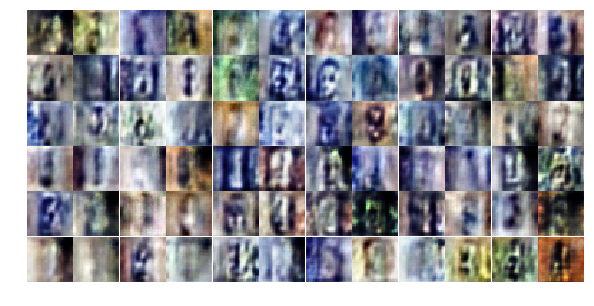

Epoch 3/3... Discriminator Loss: 0.3742... Generator Loss: 4.4387
Epoch 3/3... Discriminator Loss: 0.4339... Generator Loss: 2.5304
Epoch 3/3... Discriminator Loss: 0.4402... Generator Loss: 2.8246
Epoch 3/3... Discriminator Loss: 0.9451... Generator Loss: 0.8784
Epoch 3/3... Discriminator Loss: 0.7813... Generator Loss: 1.1190
Epoch 3/3... Discriminator Loss: 0.4126... Generator Loss: 3.0170
Epoch 3/3... Discriminator Loss: 0.7035... Generator Loss: 1.5194
Epoch 3/3... Discriminator Loss: 0.4751... Generator Loss: 2.9042
Epoch 3/3... Discriminator Loss: 0.4537... Generator Loss: 3.8230
Epoch 3/3... Discriminator Loss: 0.5285... Generator Loss: 1.9694


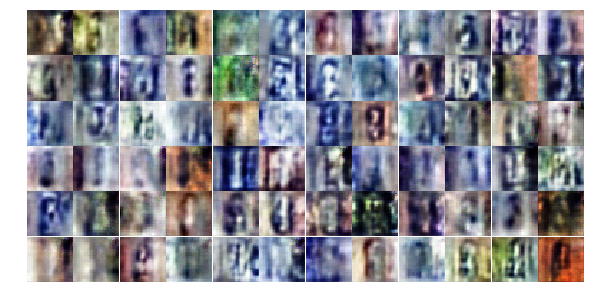

Epoch 3/3... Discriminator Loss: 0.3726... Generator Loss: 4.0813
Epoch 3/3... Discriminator Loss: 0.4681... Generator Loss: 2.4222
Epoch 3/3... Discriminator Loss: 0.9377... Generator Loss: 0.9138
Epoch 3/3... Discriminator Loss: 1.4738... Generator Loss: 2.4210
Epoch 3/3... Discriminator Loss: 1.1466... Generator Loss: 1.9504
Epoch 3/3... Discriminator Loss: 0.7690... Generator Loss: 1.9615
Epoch 3/3... Discriminator Loss: 0.6804... Generator Loss: 1.5966
Epoch 3/3... Discriminator Loss: 0.4407... Generator Loss: 3.6285
Epoch 3/3... Discriminator Loss: 0.4343... Generator Loss: 3.0882
Epoch 3/3... Discriminator Loss: 0.7073... Generator Loss: 1.3556


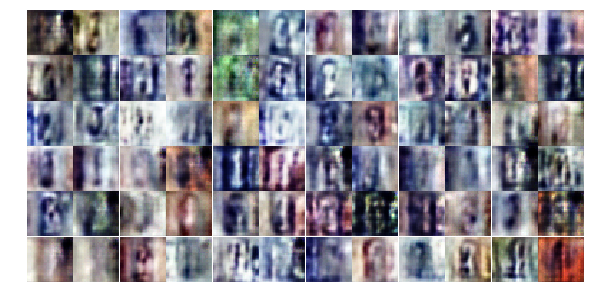

Epoch 3/3... Discriminator Loss: 0.4124... Generator Loss: 2.9298
Epoch 3/3... Discriminator Loss: 0.3710... Generator Loss: 3.8567
Epoch 3/3... Discriminator Loss: 0.3593... Generator Loss: 4.7973
Epoch 3/3... Discriminator Loss: 0.3517... Generator Loss: 5.3001
Epoch 3/3... Discriminator Loss: 0.8155... Generator Loss: 1.4512
Epoch 3/3... Discriminator Loss: 0.5088... Generator Loss: 2.0707
Epoch 3/3... Discriminator Loss: 0.6463... Generator Loss: 1.4484
Epoch 3/3... Discriminator Loss: 0.6999... Generator Loss: 1.3453
Epoch 3/3... Discriminator Loss: 0.3937... Generator Loss: 3.1213
Epoch 3/3... Discriminator Loss: 0.4343... Generator Loss: 2.6102


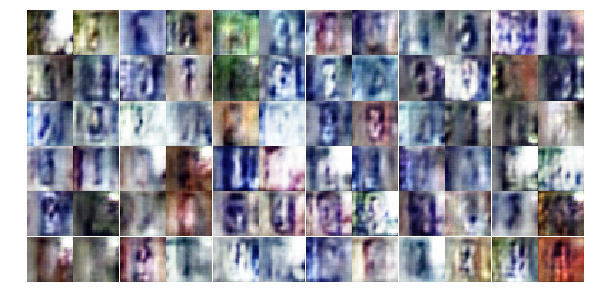

Epoch 3/3... Discriminator Loss: 0.3799... Generator Loss: 4.1590
Epoch 3/3... Discriminator Loss: 1.9064... Generator Loss: 2.3837
Epoch 3/3... Discriminator Loss: 0.3599... Generator Loss: 4.5793
Epoch 3/3... Discriminator Loss: 0.6142... Generator Loss: 1.6229
Epoch 3/3... Discriminator Loss: 0.4728... Generator Loss: 2.3248
Epoch 3/3... Discriminator Loss: 0.6875... Generator Loss: 2.2025
Epoch 3/3... Discriminator Loss: 0.3775... Generator Loss: 4.2021
Epoch 3/3... Discriminator Loss: 0.5809... Generator Loss: 1.9380
Epoch 3/3... Discriminator Loss: 0.6118... Generator Loss: 2.5988
Epoch 3/3... Discriminator Loss: 0.6165... Generator Loss: 1.5950


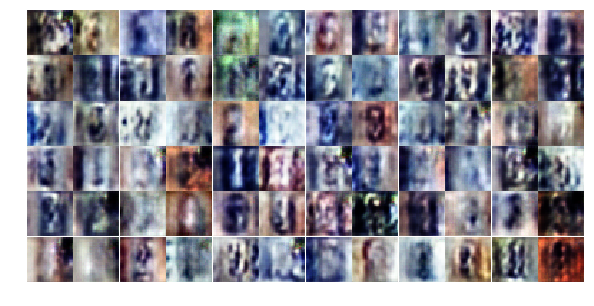

Epoch 3/3... Discriminator Loss: 0.5751... Generator Loss: 4.1335
Epoch 3/3... Discriminator Loss: 0.4515... Generator Loss: 4.4213
Epoch 3/3... Discriminator Loss: 0.3961... Generator Loss: 3.4012
Epoch 3/3... Discriminator Loss: 1.6424... Generator Loss: 5.0069
Epoch 3/3... Discriminator Loss: 0.4999... Generator Loss: 2.6683
Epoch 3/3... Discriminator Loss: 0.7153... Generator Loss: 1.3720
Epoch 3/3... Discriminator Loss: 1.6070... Generator Loss: 0.3788
Epoch 3/3... Discriminator Loss: 0.8985... Generator Loss: 0.9575
Epoch 3/3... Discriminator Loss: 0.5864... Generator Loss: 4.1661
Epoch 3/3... Discriminator Loss: 1.0093... Generator Loss: 1.2918


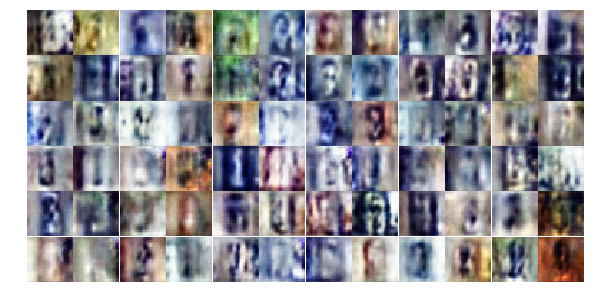

Epoch 3/3... Discriminator Loss: 0.6837... Generator Loss: 2.4305
Epoch 3/3... Discriminator Loss: 0.8085... Generator Loss: 1.1674
Epoch 3/3... Discriminator Loss: 0.5760... Generator Loss: 1.8686
Epoch 3/3... Discriminator Loss: 0.5592... Generator Loss: 4.0995
Epoch 3/3... Discriminator Loss: 0.5332... Generator Loss: 1.8585
Epoch 3/3... Discriminator Loss: 0.5500... Generator Loss: 1.9279
Epoch 3/3... Discriminator Loss: 0.4538... Generator Loss: 2.7200
Epoch 3/3... Discriminator Loss: 0.8203... Generator Loss: 1.0887
Epoch 3/3... Discriminator Loss: 1.3960... Generator Loss: 0.8103
Epoch 3/3... Discriminator Loss: 1.0888... Generator Loss: 0.7350


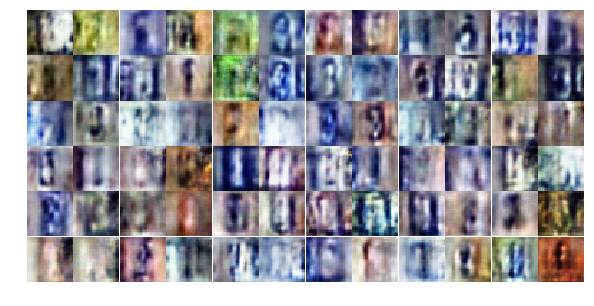

Epoch 3/3... Discriminator Loss: 0.5759... Generator Loss: 2.2186
Epoch 3/3... Discriminator Loss: 0.5976... Generator Loss: 3.0138
Epoch 3/3... Discriminator Loss: 0.6019... Generator Loss: 3.6128
Epoch 3/3... Discriminator Loss: 0.9057... Generator Loss: 1.0738
Epoch 3/3... Discriminator Loss: 0.4983... Generator Loss: 2.5956
Epoch 3/3... Discriminator Loss: 0.5416... Generator Loss: 1.9428
Epoch 3/3... Discriminator Loss: 0.7710... Generator Loss: 1.4443
Epoch 3/3... Discriminator Loss: 0.4230... Generator Loss: 3.0170
Epoch 3/3... Discriminator Loss: 0.3917... Generator Loss: 4.2008
Epoch 3/3... Discriminator Loss: 0.4319... Generator Loss: 4.9304


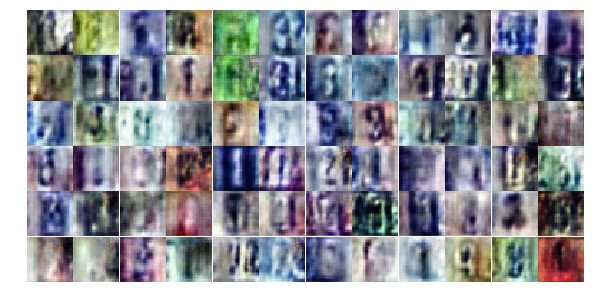

Epoch 3/3... Discriminator Loss: 0.9060... Generator Loss: 0.9472
Epoch 3/3... Discriminator Loss: 0.4308... Generator Loss: 4.1217
Epoch 3/3... Discriminator Loss: 0.4552... Generator Loss: 2.4510


In [23]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5), writer_dis=writer_discriminator, writer_gen=writer_generator)

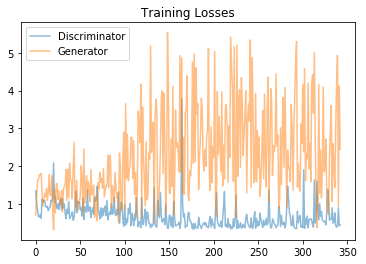

In [24]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

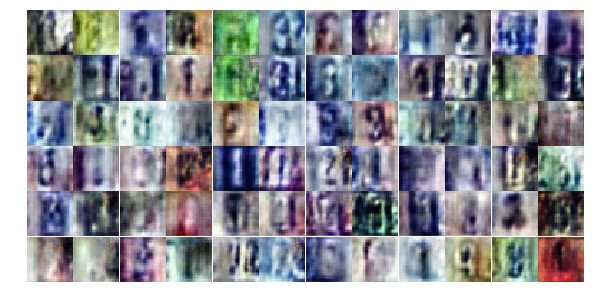

In [25]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))